In [13]:
import warnings
warnings.filterwarnings("ignore")

In [14]:
#  pip install pillow
#  pip install tensorflow_datasets
import tensorflow as tf
print(tf.__version__)

2.2.0


In [15]:
import warnings
warnings.filterwarnings("ignore")

import tensorflow_datasets as tfds
tfds.__version__

'3.2.1'

In [16]:
(raw_train, raw_validation, raw_test), metadata = tfds.load(
    'cats_vs_dogs',
    split=['train[:80%]', 'train[80%:90%]', 'train[90%:]'],
    with_info=True,
    as_supervised=True,
)

In [17]:
print(raw_train)
print(raw_validation)
print(raw_test)

<PrefetchDataset shapes: ((None, None, 3), ()), types: (tf.uint8, tf.int64)>
<PrefetchDataset shapes: ((None, None, 3), ()), types: (tf.uint8, tf.int64)>
<PrefetchDataset shapes: ((None, None, 3), ()), types: (tf.uint8, tf.int64)>


In [18]:
import matplotlib.pyplot as plt
%matplotlib inline
%config InlineBackend.figure_format = 'retina'

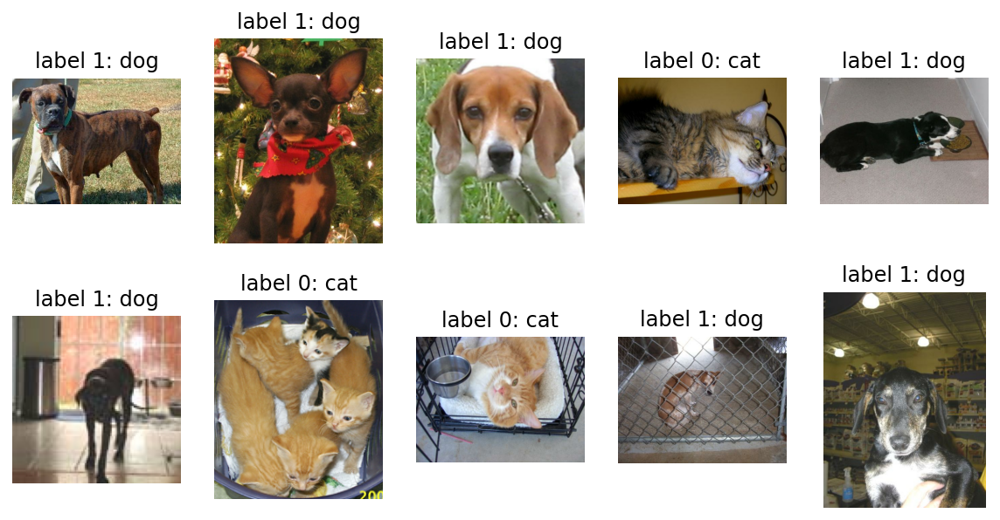

In [19]:
plt.figure(figsize=(10, 5))

get_label_name = metadata.features['label'].int2str

for idx, (image, label) in enumerate(raw_train.take(10)):
    plt.subplot(2, 5, idx+1)
    plt.imshow(image)
    plt.title(f'label {label}: {get_label_name(label)}')
    plt.axis('off')

In [20]:
IMG_SIZE = 160 # All images will be resized to 160x160

def format_example(image, label):
    image = tf.cast(image, tf.float32)  # image=float(image)같은 타입캐스팅의  텐서플로우 버전입니다.
    image = (image/127.5) - 1
    image = tf.image.resize(image, (IMG_SIZE, IMG_SIZE))
    return image, label

In [21]:
train = raw_train.map(format_example)
validation = raw_validation.map(format_example)
test = raw_test.map(format_example)

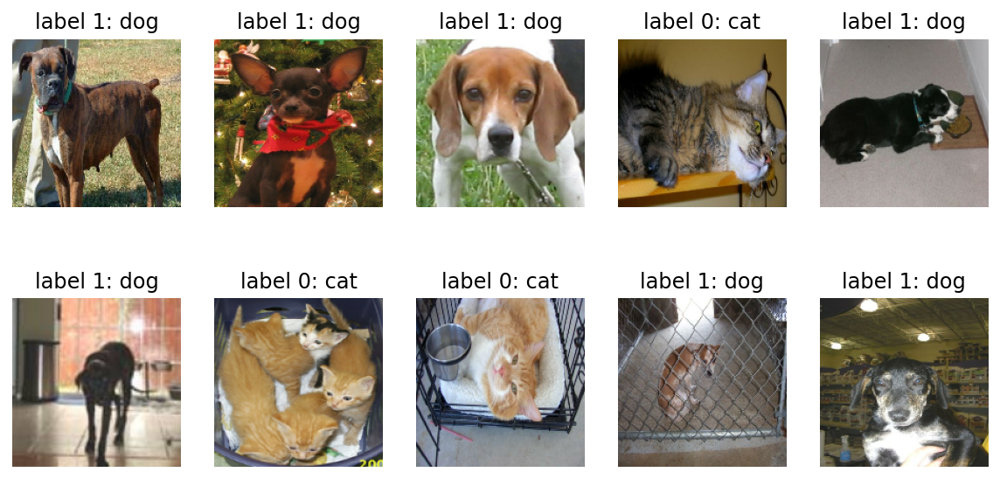

In [22]:
plt.figure(figsize=(10, 5))


get_label_name = metadata.features['label'].int2str

for idx, (image, label) in enumerate(train.take(10)):
    plt.subplot(2, 5, idx+1)
    image = (image + 1) / 2
    plt.imshow(image)
    plt.title(f'label {label}: {get_label_name(label)}')
    plt.axis('off')

In [23]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Conv2D, Flatten, MaxPooling2D

In [24]:
model = Sequential([
    Conv2D(filters=16, kernel_size=3, padding='same', activation='relu', input_shape=(160, 160, 3)),
    MaxPooling2D(),
    Conv2D(filters=32, kernel_size=3, padding='same', activation='relu'),
    MaxPooling2D(),
    Conv2D(filters=64, kernel_size=3, padding='same', activation='relu'),
    MaxPooling2D(),
    Flatten(),
    Dense(units=512, activation='relu'),
    Dense(units=2, activation='softmax')
])

In [25]:
model.summary()

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d (Conv2D)              (None, 160, 160, 16)      448       
_________________________________________________________________
max_pooling2d (MaxPooling2D) (None, 80, 80, 16)        0         
_________________________________________________________________
conv2d_1 (Conv2D)            (None, 80, 80, 32)        4640      
_________________________________________________________________
max_pooling2d_1 (MaxPooling2 (None, 40, 40, 32)        0         
_________________________________________________________________
conv2d_2 (Conv2D)            (None, 40, 40, 64)        18496     
_________________________________________________________________
max_pooling2d_2 (MaxPooling2 (None, 20, 20, 64)        0         
_________________________________________________________________
flatten (Flatten)            (None, 25600)             0

In [26]:
import numpy as np

image = np.array([[1, 2], [3, 4]])
print(image.shape)
image

(2, 2)


array([[1, 2],
       [3, 4]])

In [27]:
image.flatten()

array([1, 2, 3, 4])

In [28]:
base_learning_rate = 0.0001
model.compile(optimizer=tf.keras.optimizers.RMSprop(lr=base_learning_rate),
              loss=tf.keras.losses.sparse_categorical_crossentropy,
              metrics=['accuracy'])

In [29]:
BATCH_SIZE = 32
SHUFFLE_BUFFER_SIZE = 1000

In [30]:
train_batches = train.shuffle(SHUFFLE_BUFFER_SIZE).batch(BATCH_SIZE)
validation_batches = validation.batch(BATCH_SIZE)
test_batches = test.batch(BATCH_SIZE)

In [31]:
for image_batch, label_batch in train_batches.take(1):
    pass

image_batch.shape, label_batch.shape

(TensorShape([32, 160, 160, 3]), TensorShape([32]))

In [32]:
validation_steps = 20
loss0, accuracy0 = model.evaluate(validation_batches, steps=validation_steps)

print("initial loss: {:.2f}".format(loss0))
print("initial accuracy: {:.2f}".format(accuracy0))

20/20 [==============================] - 0s 15ms/step - loss: 0.6927 - accuracy: 0.5297
initial loss: 0.69
initial accuracy: 0.53


In [33]:
EPOCHS = 10
history = model.fit(train_batches,
                    epochs=EPOCHS,
                    validation_data=validation_batches)

Epoch 1/10
582/582 [==============================] - 30s 52ms/step - loss: 0.5914 - accuracy: 0.6793 - val_loss: 0.5211 - val_accuracy: 0.7481
Epoch 2/10
582/582 [==============================] - 19s 32ms/step - loss: 0.4760 - accuracy: 0.7724 - val_loss: 0.4953 - val_accuracy: 0.7597
Epoch 3/10
582/582 [==============================] - 19s 32ms/step - loss: 0.4107 - accuracy: 0.8106 - val_loss: 0.5297 - val_accuracy: 0.7528
Epoch 4/10
582/582 [==============================] - 19s 32ms/step - loss: 0.3575 - accuracy: 0.8428 - val_loss: 0.4718 - val_accuracy: 0.7889
Epoch 5/10
582/582 [==============================] - 19s 32ms/step - loss: 0.3031 - accuracy: 0.8724 - val_loss: 0.4741 - val_accuracy: 0.7859
Epoch 6/10
582/582 [==============================] - 19s 33ms/step - loss: 0.2527 - accuracy: 0.8970 - val_loss: 0.4864 - val_accuracy: 0.7893
Epoch 7/10
582/582 [==============================] - 19s 32ms/step - loss: 0.2007 - accuracy: 0.9211 - val_loss: 0.5337 - val_accuracy:

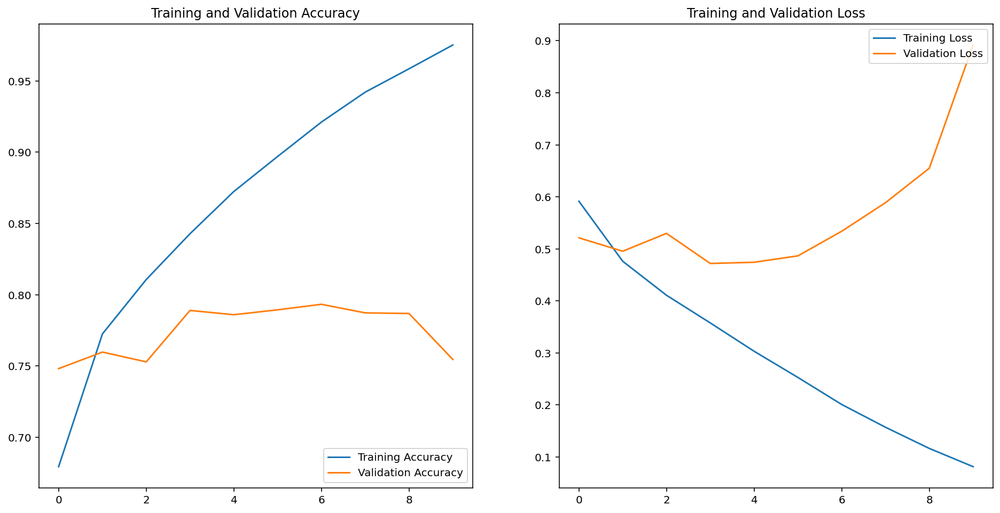

In [34]:
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']

loss=history.history['loss']
val_loss=history.history['val_loss']

epochs_range = range(EPOCHS)

plt.figure(figsize=(16, 8))
plt.subplot(1, 2, 1)
plt.plot(epochs_range, acc, label='Training Accuracy')
plt.plot(epochs_range, val_acc, label='Validation Accuracy')
plt.legend(loc='lower right')
plt.title('Training and Validation Accuracy')

plt.subplot(1, 2, 2)
plt.plot(epochs_range, loss, label='Training Loss')
plt.plot(epochs_range, val_loss, label='Validation Loss')
plt.legend(loc='upper right')
plt.title('Training and Validation Loss')
plt.show()

In [35]:
for image_batch, label_batch in test_batches.take(1):
    images = image_batch
    labels = label_batch
    predictions = model.predict(image_batch)
    pass

predictions

array([[9.9999523e-01, 4.7557369e-06],
       [9.9958903e-01, 4.1095857e-04],
       [6.9715369e-01, 3.0284628e-01],
       [9.9998188e-01, 1.8075369e-05],
       [4.0923029e-01, 5.9076965e-01],
       [9.7500527e-01, 2.4994694e-02],
       [4.9199980e-02, 9.5080000e-01],
       [9.9866617e-01, 1.3338558e-03],
       [8.9553201e-01, 1.0446795e-01],
       [8.2061154e-01, 1.7938840e-01],
       [9.3126678e-01, 6.8733245e-02],
       [9.9999893e-01, 1.0848167e-06],
       [9.9997318e-01, 2.6861137e-05],
       [7.1791825e-03, 9.9282080e-01],
       [9.9468082e-01, 5.3191637e-03],
       [9.9998665e-01, 1.3353298e-05],
       [7.1708781e-01, 2.8291222e-01],
       [2.9628794e-03, 9.9703717e-01],
       [9.9672961e-01, 3.2703653e-03],
       [9.9994922e-01, 5.0732640e-05],
       [9.7847694e-01, 2.1523064e-02],
       [9.8964942e-01, 1.0350548e-02],
       [9.9980277e-01, 1.9729843e-04],
       [9.9803454e-01, 1.9654320e-03],
       [9.9983287e-01, 1.6716220e-04],
       [3.1196678e-01, 6.

In [36]:
import numpy as np
predictions = np.argmax(predictions, axis=1)
predictions

array([0, 0, 0, 0, 1, 0, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 0,
       0, 0, 0, 1, 0, 0, 0, 0, 0, 0])

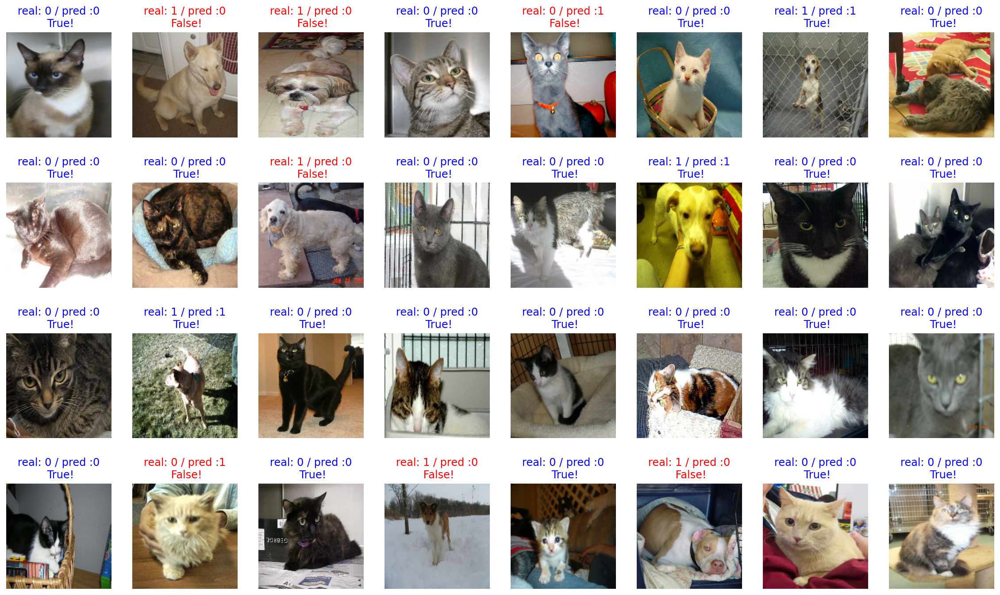

In [37]:
plt.figure(figsize=(20, 12))

for idx, (image, label, prediction) in enumerate(zip(images, labels, predictions)):
    plt.subplot(4, 8, idx+1)
    image = (image + 1) / 2
    plt.imshow(image)
    correct = label == prediction
    title = f'real: {label} / pred :{prediction}\n {correct}!'
    if not correct:
        plt.title(title, fontdict={'color': 'red'})
    else:
        plt.title(title, fontdict={'color': 'blue'})
    plt.axis('off')

In [38]:
count = 0   # 정답을 맞춘 개수
for image, label, prediction in zip(images, labels, predictions):
    correct = label == prediction
    if correct:
        count = count + 1


print(count / 32 * 100)    # 약 70% 내외

78.125


In [39]:
IMG_SHAPE = (IMG_SIZE, IMG_SIZE, 3)

# Create the base model from the pre-trained model VGG16
base_model = tf.keras.applications.VGG16(input_shape=IMG_SHAPE,
                                         include_top=False,
                                         weights='imagenet')

In [40]:
image_batch.shape

TensorShape([32, 160, 160, 3])

In [42]:
feature_batch = base_model(image_batch)
feature_batch.shape

TensorShape([32, 5, 5, 512])

In [43]:
base_model.summary()

Model: "vgg16"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_1 (InputLayer)         [(None, 160, 160, 3)]     0         
_________________________________________________________________
block1_conv1 (Conv2D)        (None, 160, 160, 64)      1792      
_________________________________________________________________
block1_conv2 (Conv2D)        (None, 160, 160, 64)      36928     
_________________________________________________________________
block1_pool (MaxPooling2D)   (None, 80, 80, 64)        0         
_________________________________________________________________
block2_conv1 (Conv2D)        (None, 80, 80, 128)       73856     
_________________________________________________________________
block2_conv2 (Conv2D)        (None, 80, 80, 128)       147584    
_________________________________________________________________
block2_pool (MaxPooling2D)   (None, 40, 40, 128)       0     

In [44]:
feature_batch.shape

TensorShape([32, 5, 5, 512])

In [45]:
import numpy as np

image = np.array([[1, 2],
                  [3, 4]])

flattened_image = image.flatten()

print("Original image:\n", image)
print("Original image shape:", image.shape)
print()
print("Flattened image:\n", flattened_image)
print("Flattened image shape:", flattened_image.shape)

Original image:
 [[1 2]
 [3 4]]
Original image shape: (2, 2)

Flattened image:
 [1 2 3 4]
Flattened image shape: (4,)


In [46]:
global_average_layer = tf.keras.layers.GlobalAveragePooling2D()

In [47]:
feature_batch_average = global_average_layer(feature_batch)
print(feature_batch_average.shape)

(32, 512)


In [48]:
dense_layer = tf.keras.layers.Dense(512, activation='relu')
prediction_layer = tf.keras.layers.Dense(2, activation='softmax')

# feature_batch_averag가 dense_layer를 거친 결과가 다시 prediction_layer를 거치게 되면
prediction_batch = prediction_layer(dense_layer(feature_batch_average))  
print(prediction_batch.shape)

(32, 2)


In [49]:
base_model.trainable = False

In [50]:
model = tf.keras.Sequential([
  base_model,
  global_average_layer,
  dense_layer,
  prediction_layer
])

In [51]:
model.summary()

Model: "sequential_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
vgg16 (Model)                (None, 5, 5, 512)         14714688  
_________________________________________________________________
global_average_pooling2d (Gl (None, 512)               0         
_________________________________________________________________
dense_2 (Dense)              (None, 512)               262656    
_________________________________________________________________
dense_3 (Dense)              (None, 2)                 1026      
Total params: 14,978,370
Trainable params: 263,682
Non-trainable params: 14,714,688
_________________________________________________________________


In [52]:
base_learning_rate = 0.0001
model.compile(optimizer=tf.keras.optimizers.RMSprop(lr=base_learning_rate),
              loss=tf.keras.losses.sparse_categorical_crossentropy,
              metrics=['accuracy'])

In [53]:
validation_steps=20
loss0, accuracy0 = model.evaluate(validation_batches, steps = validation_steps)

print("initial loss: {:.2f}".format(loss0))
print("initial accuracy: {:.2f}".format(accuracy0))

20/20 [==============================] - 1s 56ms/step - loss: 0.8652 - accuracy: 0.4703
initial loss: 0.87
initial accuracy: 0.47


In [54]:
EPOCHS = 5   # 이번에는 이전보다 훨씬 빠르게 수렴되므로 5Epoch이면 충분합니다.

history = model.fit(train_batches,
                    epochs=EPOCHS,
                    validation_data=validation_batches)

Epoch 1/5
582/582 [==============================] - 78s 134ms/step - loss: 0.2563 - accuracy: 0.9079 - val_loss: 0.1775 - val_accuracy: 0.9312
Epoch 2/5
582/582 [==============================] - 47s 80ms/step - loss: 0.1592 - accuracy: 0.9359 - val_loss: 0.1514 - val_accuracy: 0.9347
Epoch 3/5
582/582 [==============================] - 47s 80ms/step - loss: 0.1452 - accuracy: 0.9403 - val_loss: 0.1469 - val_accuracy: 0.9355
Epoch 4/5
582/582 [==============================] - 47s 80ms/step - loss: 0.1385 - accuracy: 0.9430 - val_loss: 0.1420 - val_accuracy: 0.9372
Epoch 5/5
582/582 [==============================] - 47s 80ms/step - loss: 0.1335 - accuracy: 0.9448 - val_loss: 0.1390 - val_accuracy: 0.9420


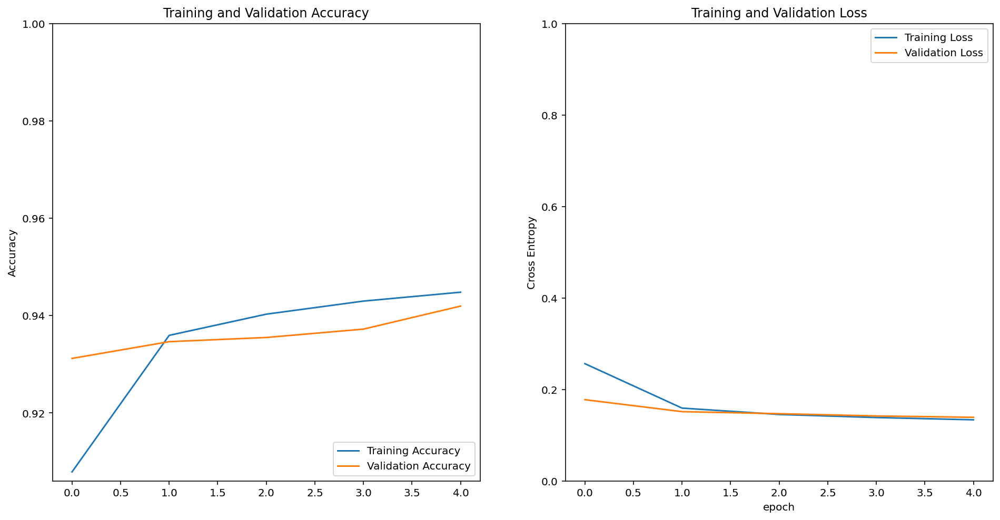

In [55]:
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']

loss = history.history['loss']
val_loss = history.history['val_loss']

plt.figure(figsize=(16, 8))
plt.subplot(1, 2, 1)
plt.plot(acc, label='Training Accuracy')
plt.plot(val_acc, label='Validation Accuracy')
plt.legend(loc='lower right')
plt.ylabel('Accuracy')
plt.ylim([min(plt.ylim()),1])
plt.title('Training and Validation Accuracy')

plt.subplot(1, 2, 2)
plt.plot(loss, label='Training Loss')
plt.plot(val_loss, label='Validation Loss')
plt.legend(loc='upper right')
plt.ylabel('Cross Entropy')
plt.ylim([0,1.0])
plt.title('Training and Validation Loss')
plt.xlabel('epoch')
plt.show()

In [56]:
for image_batch, label_batch in test_batches.take(1):
    images = image_batch
    labels = label_batch
    predictions = model.predict(image_batch)
    pass

predictions

array([[9.99987960e-01, 1.20725417e-05],
       [1.11845776e-01, 8.88154268e-01],
       [2.53671467e-01, 7.46328533e-01],
       [9.99993682e-01, 6.34652997e-06],
       [9.96723115e-01, 3.27691296e-03],
       [9.84958172e-01, 1.50418160e-02],
       [1.15546994e-04, 9.99884486e-01],
       [6.57047808e-01, 3.42952222e-01],
       [9.54659462e-01, 4.53404821e-02],
       [9.59684849e-01, 4.03151922e-02],
       [3.98727789e-05, 9.99960184e-01],
       [9.99947548e-01, 5.24777824e-05],
       [9.86647248e-01, 1.33527983e-02],
       [2.16750618e-06, 9.99997854e-01],
       [9.98430431e-01, 1.56956166e-03],
       [9.86454844e-01, 1.35451397e-02],
       [9.95581448e-01, 4.41851886e-03],
       [2.41427086e-02, 9.75857317e-01],
       [6.19672477e-01, 3.80327523e-01],
       [9.94010508e-01, 5.98946447e-03],
       [9.16114748e-01, 8.38852748e-02],
       [9.78500307e-01, 2.14996673e-02],
       [9.93789971e-01, 6.20998768e-03],
       [9.75626111e-01, 2.43739337e-02],
       [9.982994

In [57]:
import numpy as np
predictions = np.argmax(predictions, axis=1)
predictions

array([0, 1, 1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 1, 0, 1, 0, 0])

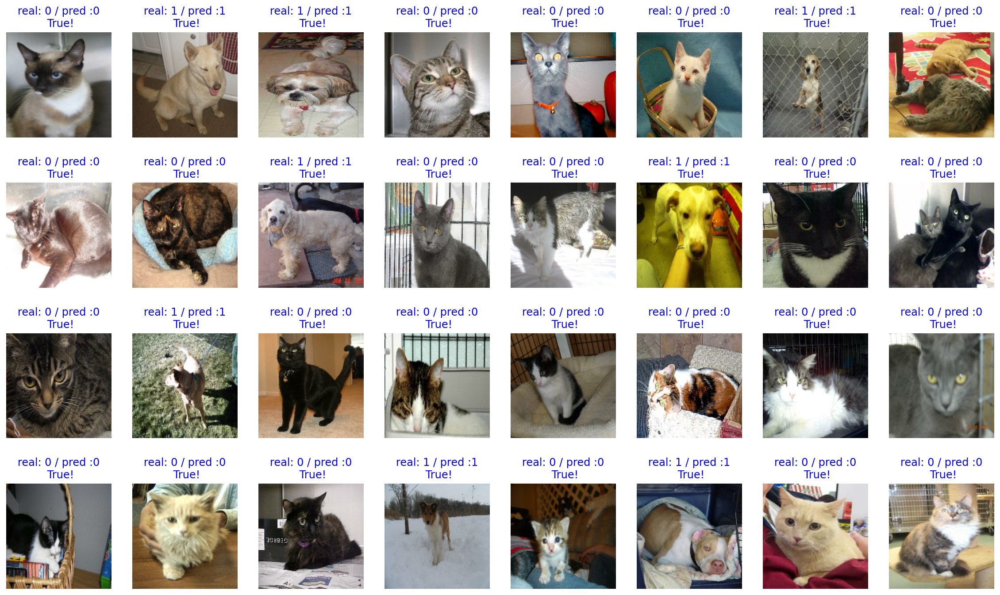

In [58]:
plt.figure(figsize=(20, 12))

for idx, (image, label, prediction) in enumerate(zip(images, labels, predictions)):
    plt.subplot(4, 8, idx+1)
    image = (image + 1) / 2
    plt.imshow(image)
    correct = label == prediction
    title = f'real: {label} / pred :{prediction}\n {correct}!'
    if not correct:
        plt.title(title, fontdict={'color': 'red'})
    else:
        plt.title(title, fontdict={'color': 'blue'})
    plt.axis('off')

In [59]:
count = 0
for image, label, prediction in zip(images, labels, predictions):
    correct = label == prediction
    if correct:
        count = count + 1

print(count / 32 * 100) # 약 95% 내외

100.0


In [60]:
import os

checkpoint_dir = os.getenv("HOME") + "/aiffel/cat_vs_dog/checkpoint"
checkpoint_file_path = os.path.join(checkpoint_dir, 'checkpoint')

if not os.path.exists('checkpoint_dir'):
    os.mkdir('checkpoint_dir')
    
model.save_weights(checkpoint_file_path)     # checkpoint 파일 생성

if os.path.exists(checkpoint_file_path):
  print('checkpoint 파일 생성 OK!!')

checkpoint 파일 생성 OK!!


In [61]:
img_dir_path = os.getenv("HOME") + "/aiffel/cat_vs_dog/images"
os.path.exists(img_dir_path)

True

In [62]:
from tensorflow.keras.preprocessing.image import load_img, img_to_array

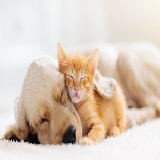

In [63]:
IMG_SIZE = 160
dog_image_path = os.path.join(img_dir_path, 'my_dog.jpeg')

dog_image = load_img(dog_image_path, target_size=(IMG_SIZE, IMG_SIZE))
dog_image

In [64]:
dog_image = img_to_array(dog_image).reshape(1, IMG_SIZE, IMG_SIZE, 3)
dog_image.shape

(1, 160, 160, 3)

In [65]:
prediction = model.predict(dog_image)
prediction

array([[1.0000000e+00, 1.7666348e-15]], dtype=float32)

In [66]:
def show_and_predict_image(dirpath, filename, img_size=160):
    filepath = os.path.join(dirpath, filename)
    image = load_img(filepath, target_size=(img_size, img_size))
    plt.imshow(image)
    plt.axis('off')
    image = img_to_array(image).reshape(1, img_size, img_size, 3)
    prediction = model.predict(image)[0]
    cat_percentage = round(prediction[0] * 100)
    dog_percentage = round(prediction[1] * 100)
    print(f"This image seems {dog_percentage}% dog, and {cat_percentage}% cat.")

This image seems 0.0% dog, and 100.0% cat.


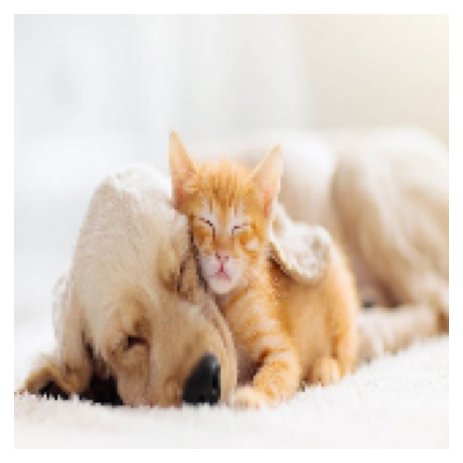

In [67]:
filename = 'my_dog.jpeg'

show_and_predict_image(img_dir_path, filename)

This image seems 0.0% dog, and 100.0% cat.


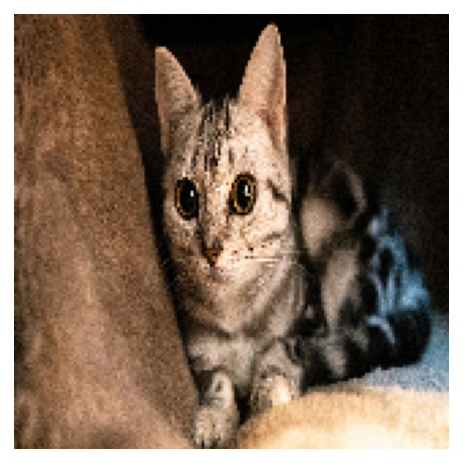

In [68]:
filename = 'my_cat.jpeg'

show_and_predict_image(img_dir_path, filename)

This image seems 100.0% dog, and 0.0% cat.


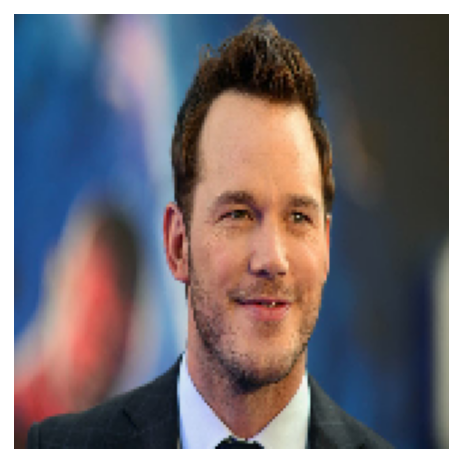

In [69]:
filename = "cat_face.jpg"
show_and_predict_image(img_dir_path, filename)